# Projet E3 : TATOUAGE DE SON

L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide dun micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceintes.

# PARTIE 1 : Emetteur

## P.1.1 Choix de la musique 

In [3]:
# enable plots in the notebook
import matplotlib.pyplot as plt
# makes our plots prettier
import seaborn
seaborn.set(style='ticks')

#import the audio playback widget
from IPython.display import Audio
from scipy import signal

# useful librairies
import mir_eval
import numpy as np
import scipy
import librosa
import librosa.display
from pydub import AudioSegment 
from ModulationPy import PSKModem, QAMModem

import wave
from scipy.io import wavfile
import contextlib

In [4]:
def interpret_wav(raw_bytes, n_frames, n_channels, sample_width, interleaved = True):

    if sample_width == 1:
        dtype = np.uint8 # unsigned char
    elif sample_width == 2:
        dtype = np.int16 # signed 2-byte short
    else:
        raise ValueError("Only supports 8 and 16 bit audio formats.")

    channels = np.frombuffer(raw_bytes, dtype=dtype)

    if interleaved:
        # channels are interleaved, i.e. sample N of channel M follows sample N of channel M-1 in raw data
        channels.shape = (n_frames, n_channels)
        channels = channels.T
    else:
        # channels are not interleaved. All samples from channel M occur before all samples from channel M-1
        channels.shape = (n_channels, n_frames)

    return channels

def get_start_end_frames(nFrames, sampleRate, tStart=None, tEnd=None):

    if tStart and tStart*sampleRate<nFrames:
        start = tStart*sampleRate
    else:
        start = 0

    if tEnd and tEnd*sampleRate<nFrames and tEnd*sampleRate>start:
        end = tEnd*sampleRate
    else:
        end = nFrames

    return (start,end,end-start)

def extract_audio(fname, tStart=None, tEnd=None):
    with contextlib.closing(wave.open(fname,'rb')) as spf:
        sampleRate = spf.getframerate()
        ampWidth = spf.getsampwidth()
        nChannels = spf.getnchannels()
        nFrames = spf.getnframes()

        startFrame, endFrame, segFrames = get_start_end_frames(nFrames, sampleRate, tStart, tEnd)

        # Extract Raw Audio from multi-channel Wav File
        spf.setpos(startFrame)
        sig = spf.readframes(segFrames)
        spf.close()

        channels = interpret_wav(sig, segFrames, nChannels, ampWidth, True)

        return (channels, nChannels, sampleRate, ampWidth, nFrames)

def convert_to_mono(channels, nChannels, outputType):
    if nChannels == 2:
        samples = np.mean(np.array([channels[0], channels[1]]), axis=0)  # Convert to mono
    else:
        samples = channels[0]

    return samples.astype(outputType)

def plot_specgram(samples, sampleRate, tStart=None, tEnd=None):
    plt.figure(figsize=(20,10))
    plt.specgram(samples, Fs=sampleRate, NFFT=1024, noverlap=192, cmap='nipy_spectral', xextent=(tStart,tEnd))
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.show()

def plot_audio_samples(title, samples, sampleRate, tStart=None, tEnd=None):
    if not tStart:
        tStart = 0

    if not tEnd or tStart>tEnd:
        tEnd = len(samples)/sampleRate

    f, axarr = plt.subplots(2, sharex=True, figsize=(20,10))
    axarr[0].set_title(title)
    axarr[0].plot(np.linspace(tStart, tEnd, len(samples)), samples)
    axarr[1].specgram(samples, Fs=sampleRate, NFFT=1024, noverlap=192, cmap='nipy_spectral', xextent=(tStart,tEnd))
    #get_specgram(axarr[1], samples, sampleRate, tStart, tEnd)

    axarr[0].set_ylabel('Amplitude')
    axarr[1].set_ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')

    plt.show()

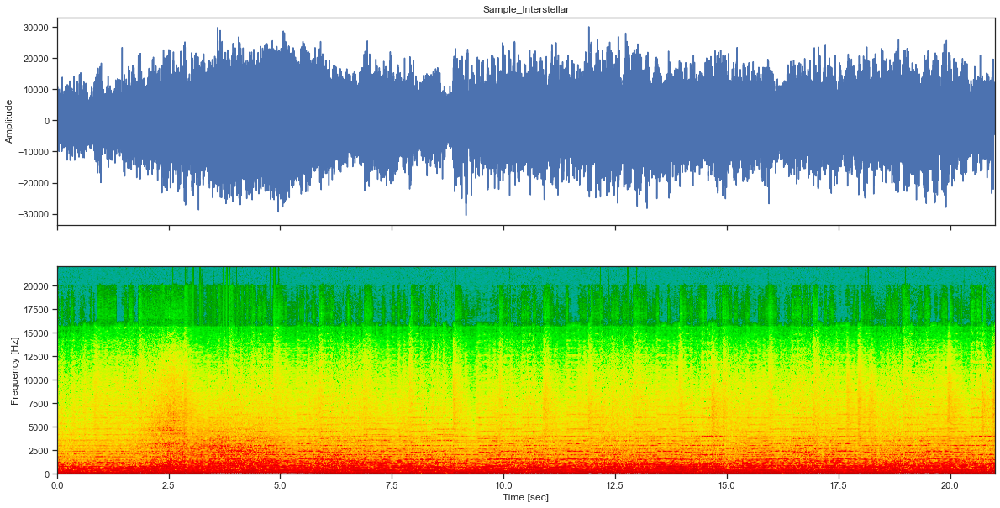

In [5]:
tStart=0
tEnd=21

channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('sample_interstellar.wav', tStart, tEnd)
samples = convert_to_mono(channels, nChannels, np.int16)

plot_audio_samples("Sample_Interstellar", samples, sampleRate, tStart, tEnd)

In [6]:
Audio (samples,rate =sampleRate) 

## P1.2 Filtre passe-bas

In [7]:
def fir_high_pass(samples, fs, fH, N, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs

    # Compute sinc filter.
    h = np.sinc(2 * fH * (np.arange(N) - (N - 1) / 2.)) 
    # Apply window.
    h *= np.hamming(N)
    # Normalize to get unity gain.
    h /= np.sum(h)
    # Create a high-pass filter from the low-pass filter through spectral inversion.
    h = -h
    h[int((N - 1) / 2)] += 1
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)
    return s


def fir_low_pass(samples, fs, fL, N, outputType):
    # Referece: https://fiiir.com

    fL = fL / fs

    # Compute sinc filter.
    h = np.sinc(2 * fL * (np.arange(N) - (N - 1) / 2.))
    # Apply window.
    h *= np.hamming(N)
    # Normalize to get unity gain.
    h /= np.sum(h)
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)
    return s

def fir_band_reject(samples, fs, fL, fH, NL, NH, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs
    fL = fL / fs

    # Compute a low-pass filter with cutoff frequency fL.
    hlpf = np.sinc(2 * fL * (np.arange(NL) - (NL - 1) / 2.))
    hlpf *= np.blackman(NL)
    hlpf /= np.sum(hlpf)
    # Compute a high-pass filter with cutoff frequency fH.
    hhpf = np.sinc(2 * fH * (np.arange(NH) - (NH - 1) / 2.))
    hhpf *= np.blackman(NH)
    hhpf /= np.sum(hhpf)
    hhpf = -hhpf
    hhpf[int((NH - 1) / 2)] += 1
    # Add both filters.
    if NH >= NL:
        h = hhpf
        h[int((NH - NL) / 2) : int((NH - NL) / 2 + NL)] += hlpf
    else:
        h = hlpf
        h[int((NL - NH) / 2) : int((NL - NH) / 2 + NH)] += hhpf
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)

    return s

def fir_band_pass(samples, fs, fL, fH, NL, NH, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs
    fL = fL / fs

    # Compute a low-pass filter with cutoff frequency fH.
    hlpf = np.sinc(2 * fH * (np.arange(NH) - (NH - 1) / 2.))
    hlpf *= np.blackman(NH)
    hlpf /= np.sum(hlpf)
    # Compute a high-pass filter with cutoff frequency fL.
    hhpf = np.sinc(2 * fL * (np.arange(NL) - (NL - 1) / 2.))
    hhpf *= np.blackman(NL)
    hhpf /= np.sum(hhpf)
    hhpf = -hhpf
    hhpf[int((NL - 1) / 2)] += 1
    # Convolve both filters.
    h = np.convolve(hlpf, hhpf)
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)

    return s

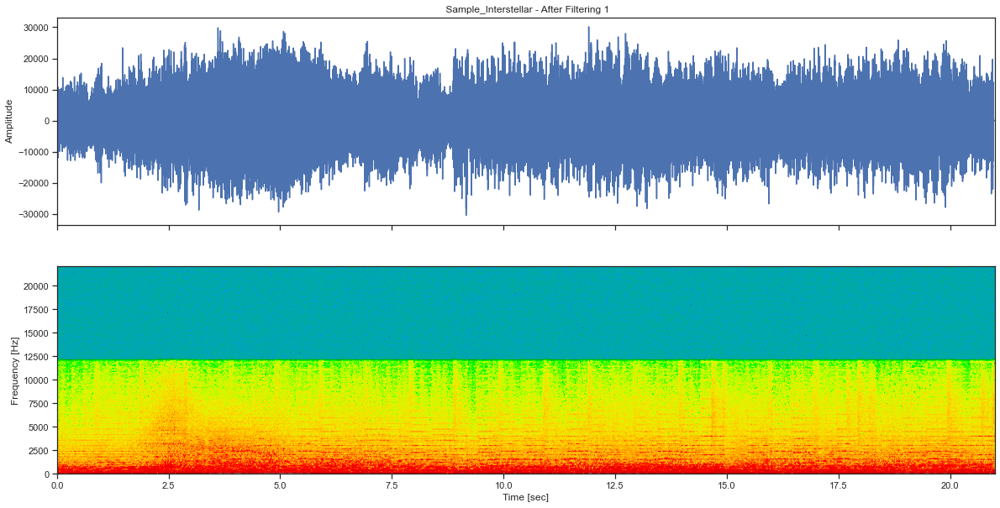

In [8]:
lp_samples_filtered = fir_low_pass(samples, sampleRate, 12000, 461, np.int16)             # First pass
lp_samples_filtered = fir_low_pass(lp_samples_filtered, sampleRate, 12000, 461, np.int16) # Second pass

plot_audio_samples(" Sample_Interstellar - After Filtering 1", lp_samples_filtered, sampleRate, tStart, tEnd)

In [9]:
Audio(data=lp_samples_filtered, rate = sampleRate)
# A télécharger : "sample_Intestellar_Filtered" sous format WAV

## P1.3 Informations à transmettre

In [10]:
from turtle import *
import math


"""
Description :
- Accepte toutes les dimensions de dessin (dans la limite du raisonnable, ne pas dépasser 30x30 pixel).
- PAR EXEMPLE pour dessiner le logo ESIEE, utilisez un fichier txt contenant ceci :

111110011111001000111110011111
110000011000001100110000011000
111110011111001100011110011111
110000000011001100110000011000
111110011111001100111110011111

- Ne pas oublier de fermer turtle avec la commande, bye().

"""


#dessin d'un pixel
def dessinerPixel(x , y):
    fillcolor("black")
    up()
    goto(x,y)
    down()
    begin_fill()
    for i in range(4):
        forward(20)
        left(90)
    end_fill()



#dessine l'image a partir du fichier txt mis en parametre
def dessinerASCII(nomFichier):
    #Variables
    x =-300
    y = 100

    #parametres du stylo
    speed(15)
    delay(0)
    hideturtle()

    fichier = open(nomFichier, "r")
    lignes = fichier.readlines()
    for ligne in lignes:
        for bit in ligne:
            if(bit == "1"):
                dessinerPixel(x , y)
            x+=20
        y-=20
        x=-300
    print("dessin terminé")

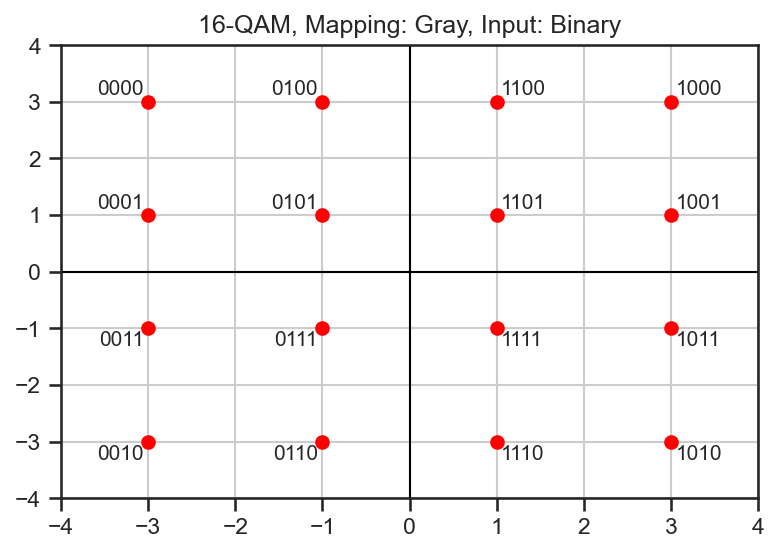

In [11]:
modem = QAMModem(16, 
                 bin_input=True,
                 soft_decision=False,
                 bin_output=True)
modem.plot_const()

In [12]:
def binaire(s):
    ords = (ord(c) for c in s)
    shifts = (7, 6, 5, 4, 3, 2, 1, 0)
    return [(o >> shift) & 1 for o in ords for shift in shifts]

def char(bits):
    chars = []
    for b in range(int(len(bits) / 8)):
        byte = bits[b*8:(b+1)*8]
        chars.append(chr(int(''.join([str(bit) for bit in byte]), 2)))
    return ''.join(chars)

texte = "L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide d’un micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceintes."
texte_bin = binaire(texte) #Texte convertit en binaire
texte_binaire = np.array(texte_bin)#Permet de convertir list en array

image = np.array([1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0]) # message d'entrée

msg = np.concatenate((image,texte_binaire)) #msg = image + texte que l'on souhaite transmettre 

print(msg[160:170])
print(texte_binaire[0:10])
print(len(texte))
print(msg.shape)
print(image.shape)
print(texte_binaire.shape)

[0 1 0 0 1 1 0 0 0 0]
[0 1 0 0 1 1 0 0 0 0]
533
(4424,)
(160,)
(4264,)


In [13]:
texte_char = char(texte_binaire) #Convertit du binaire au texte -> Vérification de la conversion en binaire
print(texte_char)

L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide dun micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceintes.


In [14]:
modulation = modem.modulate(msg) # modulation -> Moduler un tableau de bits en symboles de constellation
print ( " Message modulé : \n " + str (modulation)+ "\n")
print(len(modulation))
demodulation = modem.demodulate(modulation) #démodulation
print ( " Message démodulé : \n " + str (demodulation))

 Message modulé : 
 [ 1.-1.j  3.+1.j  1.-1.j ... -3.-1.j -3.-3.j  1.-3.j]

1106
 Message démodulé : 
 [1. 1. 1. ... 1. 1. 0.]


In [15]:
#ici on veut s'assurer qu'il n'y a pas eu d'erreur dans la modulation et la démodulation
np.array_equal(msg, demodulation)#On regarde si le message de base est égal à ce qu'on a obtenu apres la demodulation

True

In [16]:
symbols_real = modulation.real
symbols_imag = modulation.imag
print(symbols_real)
print(symbols_imag)

[ 1.  3.  1. ... -3. -3.  1.]
[-1.  1. -1. ... -1. -3. -3.]


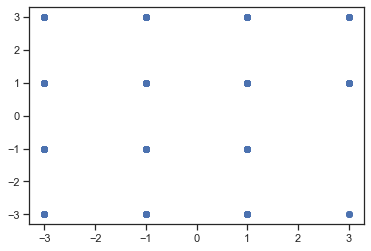

In [17]:
plt.scatter(symbols_real,symbols_imag)

## P1.4 Convolution 

In [18]:
#Etape 2 : convolution
import scipy
from commpy.filters import rcosfilter

Tsymbol = 0.0001875*100  # pour correspondre à la durée du sample 

# Débit binaire D = log2(M)/Tsymbol = n/Tsymbol = 21,333 kbps
# augmenter le Tsymbol revient à diminuer le débit binaire D

# B>= (1+ alpha)/Tsymbol --> Tsymbol >= 0.1875 ms

Fsamp = sampleRate
alpha = 1/2
N = int(5*Tsymbol*Fsamp)
delta_symbols = np.zeros(len(modulation)*int(Tsymbol*Fsamp),dtype =complex)
delta_symbols[::int(Tsymbol*Fsamp)]= modulation

4134


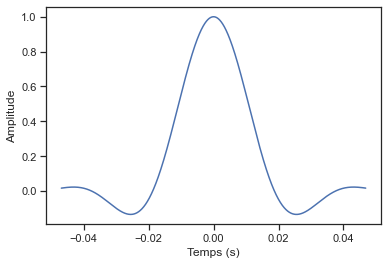

In [19]:
temps, h_rc = rcosfilter(N, alpha, Tsymbol, Fsamp)
print(len(h_rc))
plt.plot(temps, h_rc)
plt.ylabel('Amplitude')
plt.xlabel('Temps (s)')

plt.show()

[0.99948972-0.99996453j 1.00214318-0.99881347j 1.00480059-0.99765258j ...
 0.00819255-0.01049291j 0.00660893-0.00821696j 0.00503142-0.00594866j]


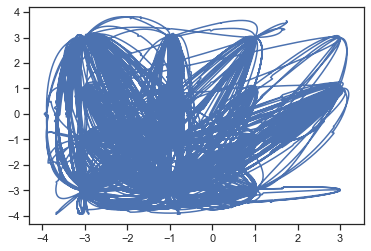

In [20]:
convo = np.convolve(delta_symbols , h_rc, mode="same") 
print(convo)
plt.figure()
plt.plot(np.real(convo), np.imag(convo))

In [21]:
Audio ( data = convo, rate = sampleRate)

C:\Users\Raoul\anaconda3\lib\site-packages\IPython\lib\display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


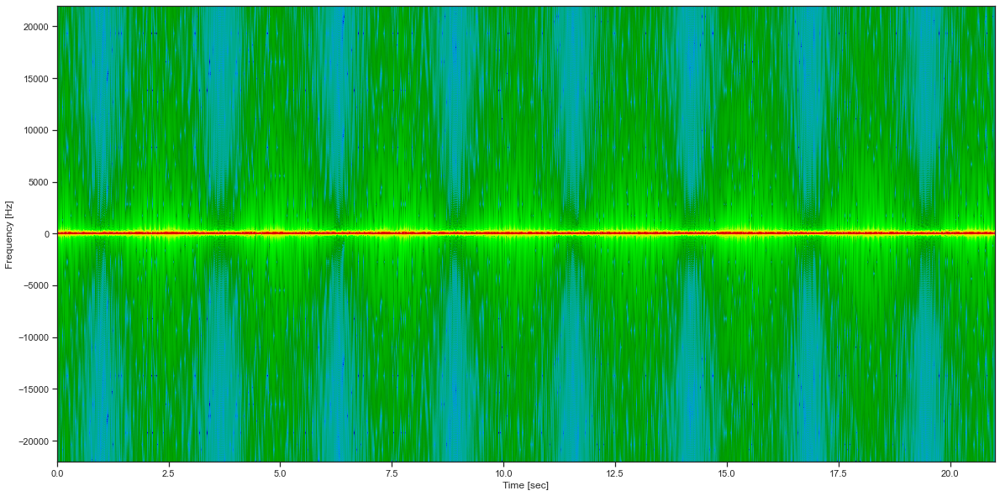

In [22]:
plot_specgram(convo, sampleRate,tStart, tEnd)

## P1.5 Shift de l'information en haute fréquence 

In [23]:
Fcoupure = 16000 
#Fréquence de coupure = milieu de la bande passante


# linspace permet d’obtenir un tableau 1D allant d’une valeur de départ (ordre croissant)
# à une valeur de fin avec un nombre donné d’éléments.

# valeur de départ --> 0
# valeur d'arrivée --> 20.71555555
# nbr valeurs dans tableau --> 913556
t=np.linspace(0 ,np.size(convo)/Fsamp,np.size(convo))
son = np.real(convo*np.exp(2*np.pi*1j*Fcoupure*t))


print(t)
print(son)

[0.00000000e+00 2.26757618e-05 4.53515236e-05 ... 2.07155102e+01
 2.07155329e+01 2.07155556e+01]
[ 9.99489721e-01  1.05896412e-01 -1.13926536e+00 ...  1.32199004e-02
 -7.86071323e-03  3.05709650e-05]


In [24]:
son2 = convo.real*np.cos(2*np.pi*Fcoupure*t)-convo.imag*np.sin(2*np.pi*Fcoupure*t)
print(son2)
print(son2.real)
print(son2.imag)

[ 9.99489721e-01  1.05896412e-01 -1.13926536e+00 ...  1.32199004e-02
 -7.86071323e-03  3.05709650e-05]
[ 9.99489721e-01  1.05896412e-01 -1.13926536e+00 ...  1.32199004e-02
 -7.86071323e-03  3.05709650e-05]
[0. 0. 0. ... 0. 0. 0.]


In [25]:
Audio ( data = son, rate = sampleRate)# ou sampleRate/2 ?
# A télécharger : "info" sous format WAV

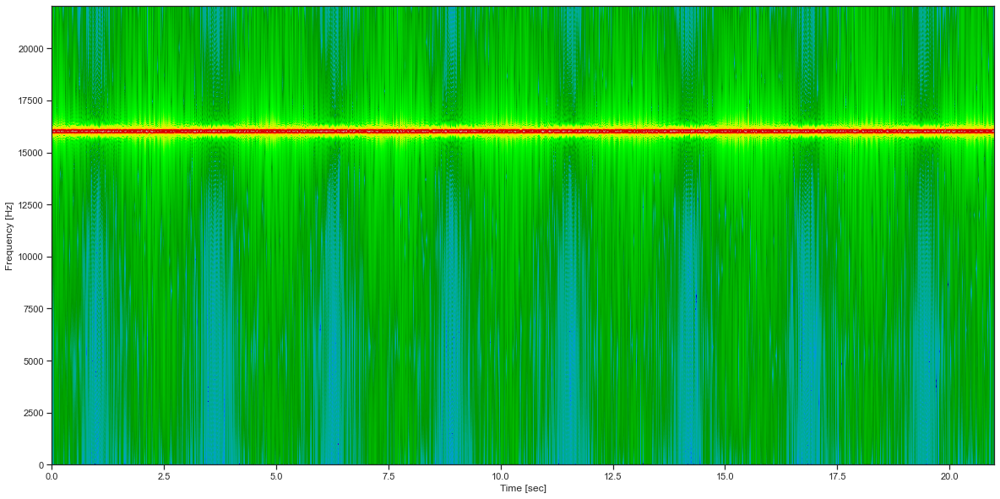

In [26]:
plot_specgram(son, sampleRate,tStart, tEnd)

## P1.6 Diminution dB de signal contenant les informations

In [27]:
from pydub import AudioSegment

song = AudioSegment.from_wav("info.wav")
# reduce volume by 25 dB
song = song - 20

# save the output
song.export("info_dimin.wav", "wav")


<_io.BufferedRandom name='info_dimin.wav'>

## P1.7 Superposition des 2 sons

In [28]:
sound1 = AudioSegment.from_file("sample_Interstellar_Filtered.wav") # son filtré 
sound2 = AudioSegment.from_file("info_dimin.wav") 
#tmpsound = sound1.overlay(sound2, position=0.15 * len(sound1))
tmpsound = sound1.overlay(sound2)
tmpsound.export('emetteur_final.wav',format='wav')

<_io.BufferedRandom name='emetteur_final.wav'>

In [29]:
channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('emetteur_final.wav', tStart, tEnd)
son_emetteur = convert_to_mono(channels, nChannels, np.int16)

In [30]:
Audio(data= son_emetteur,rate= sampleRate) # son_info

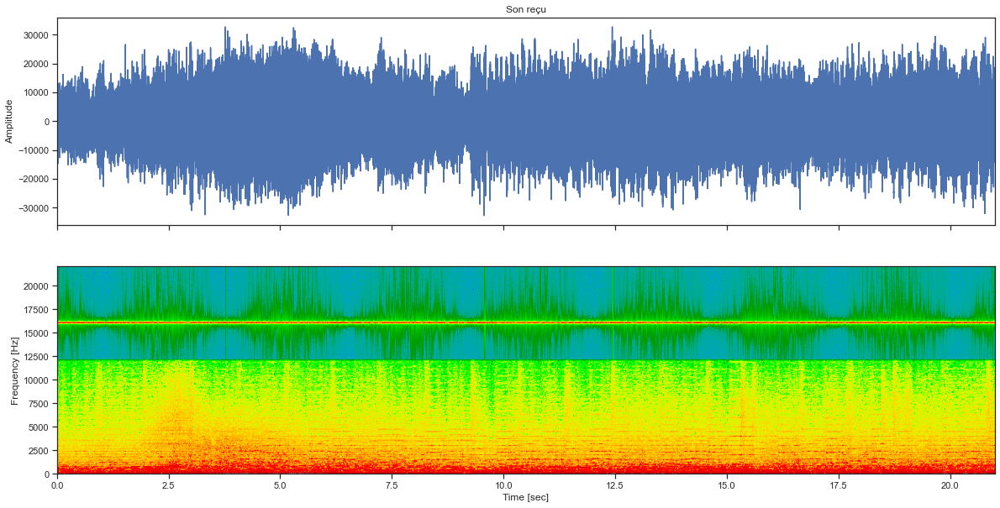

In [31]:
plot_audio_samples("Son reçu", son_emetteur, sampleRate, tStart, tEnd)

# PARTIE 2 : CANAL AUDIO

In [43]:
zu, sigma = 0,0
z = np.random.normal(zu,sigma,np.size(son_emetteur))

son_emetteur_noise = son_emetteur + z

random_desynch = np.random.randint(1,100)
vzeros = np.zeros(random_desynch,dtype = int)
son_recepteur = np.concatenate([vzeros,son_emetteur_noise])

# PARTIE 3 : RECEPTEUR

## P3.1 Filtre passe-haut

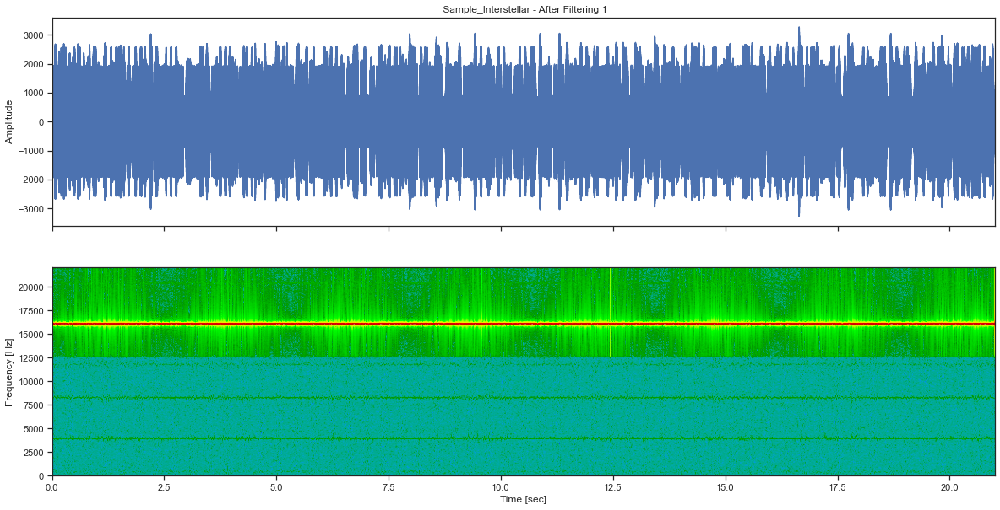

In [33]:
lh_samples_filtered = fir_high_pass(son_, sampleRate, 12500, 461, np.int16)             # First pass
lh_samples_filtered = fir_high_pass(lh_samples_filtered, sampleRate, 12500, 461, np.int16) # Second pass

plot_audio_samples(" Sample_Interstellar - After Filtering 1", lh_samples_filtered, sampleRate, tStart, tEnd)

In [34]:
Audio( data = lh_samples_filtered,rate = sampleRate)

## P3.2 Démodulation

In [45]:
Fp = 16000 #Fréquence porteuse
t = np.linspace(0,np.size(son)/Fsamp, np.size(son)) 

I_reel = 2*son*np.cos(2*np.pi*Fp*t) #composante réel en phase 
Q_quadrature = -2*son*np.sin(2*np.pi*Fp*t) #composante réel en quadrature


# Vérification son et son2 : normal de ne pas avoir les mêmes valeurs. 
# --> supprimer facteurs 2 de I_reel et Q_quadrature
son2 = I_reel*np.cos(2*np.pi*Fp*t)-Q_quadrature*np.sin(2*np.pi*Fp*t)
print(son)
print(son2) 

[ 9.99489721e-01  1.05896412e-01 -1.13926536e+00 ...  1.32199004e-02
 -7.86071323e-03  3.05709650e-05]
[ 1.99897944e+00  2.11792824e-01 -2.27853073e+00 ...  2.64398008e-02
 -1.57214265e-02  6.11419299e-05]


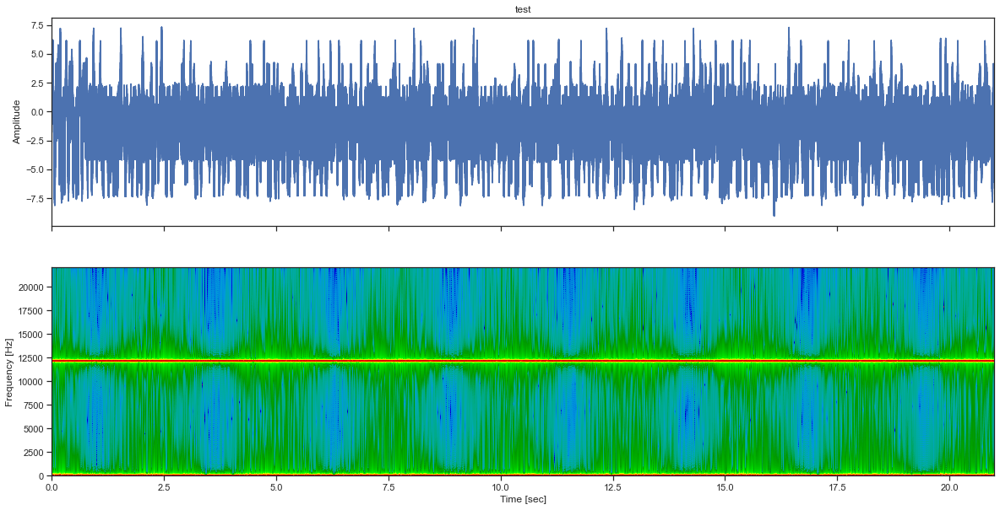

In [36]:
plot_audio_samples("test", I_reel,Fsamp, tStart, tEnd)

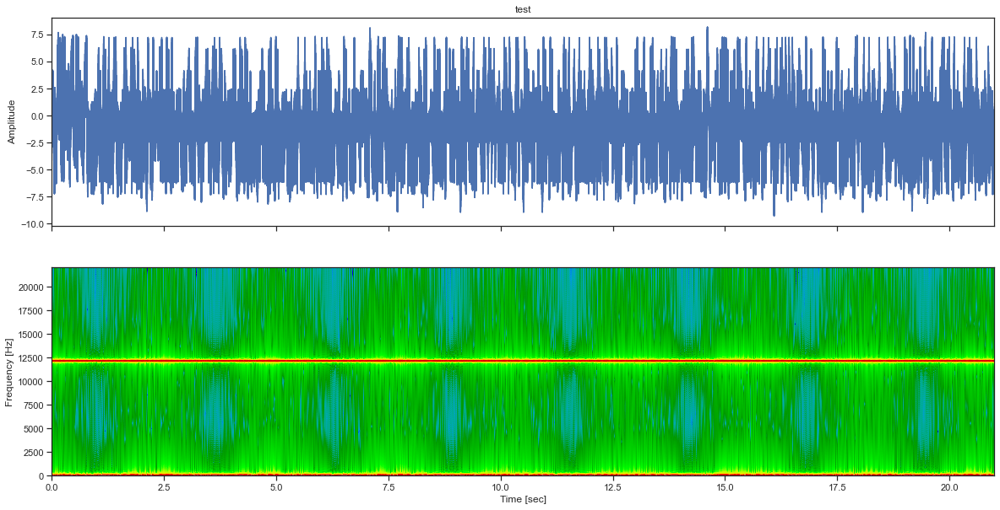

In [37]:
plot_audio_samples("test", Q_quadrature,Fsamp, tStart, tEnd)

In [38]:
I = np.convolve (I_reel, h_rc,'same')
Q = np.convolve (Q_quadrature,h_rc,'same')

[670.24812139-200.57005722j 672.62376295-200.22331043j
 675.04125093-199.93299496j ... 288.36143377-238.92812167j
 287.05165667-237.2496788j  285.80589229-235.66169553j]


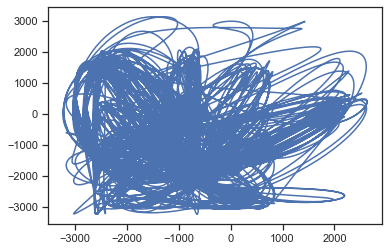

In [39]:
x_t = I+1j*Q #signal complexe en bande de base
print (x_t)
plt.figure()
plt.plot(np.real(x_t),np.imag(x_t))

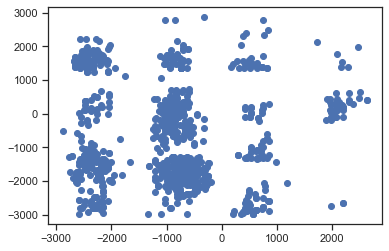

In [40]:
ech = x_t[::int(Tsymbol*Fsamp)]
plt.figure()
plt.scatter(np.real(ech), np.imag(ech))

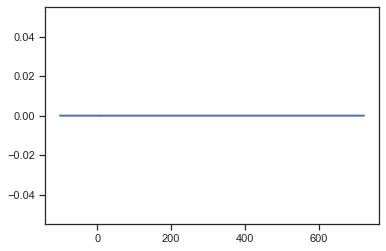

In [41]:
convo2 = np.convolve(h_rc,h_rc,'same')
plt.figure()
plt.plot(np.real(convo2), np.imag(convo2))

723.4272861593942



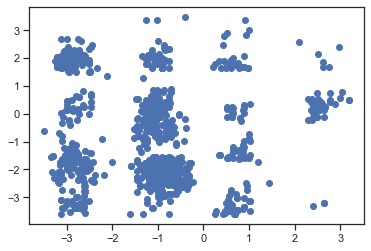

In [42]:
Mconvo2 =np.max(convo2)
print(Mconvo2)

div =ech/(len(son)/len(modulation)) #
#div = ech/(Tsymbol*Fsamp)
print()
plt.figure()
plt.scatter(np.real(div), np.imag(div))